# Used Car Prices CarGurus: Random Forest GPU
### Optuna Hyperparameter Optimization

In [ ]:
# Install/import dependencies
!pip install --upgrade pip
!pip install optuna
!pip install dask_optuna
!pip install plotly
import os
import random
import numpy as np
import cupy as cp
import warnings
from contextlib import contextmanager
import dask
import dask_optuna
import dask_cudf
from dask_cuda import LocalCUDACluster
from dask.distributed import Client, wait, performance_report
import joblib
from joblib import parallel_backend
import cudf
import cuml
from cuml.model_selection import train_test_split
from cuml.ensemble import RandomForestRegressor
import time
from datetime import datetime, timedelta
from timeit import default_timer as timer
import optuna
from optuna import Trial
optuna.logging.set_verbosity(optuna.logging.WARNING) 
import pickle
import pandas as pd
import sklearn
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import plotly.offline as py
import matplotlib.pyplot as plt
import seaborn as sns
warnings.filterwarnings('ignore')
os.environ['CUDA_VISIBLE_DEVICES'] = '0'

# Set seed 
seed_value = 42
os.environ['usedCars_rfGPU'] = str(seed_value)
cp.random.seed(seed_value)
random.seed(seed_value)
np.random.seed(seed_value)

# Define function to time code blocks
@contextmanager
def timed(name):
    t0 = time.time()
    yield
    t1 = time.time()
    print('..%-24s:  %8.4f' % (name, t1 - t0))

print('\n')
!nvidia-smi

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 55.4 MB/s eta 0:00:00:00:01
  Attempting uninstall: pip
    Found existing installation: pip 22.0.3
    Uninstalling pip-22.0.3:
      Successfully uninstalled pip-22.0.3
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 365.3/365.3 kB 30.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.8/2.8 MB 66.5 MB/s eta 0:00:00:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 210.5/210.5 kB 35.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.7/78.7 kB 19.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 610.9/610.9 kB 64.2 MB/s eta 0:00:00
  Attempting uninstall: typing-extensions
    Found existing installation: typing_extensions 4.0.1
    Uninstalling typing_extensions-4.0.1:
      Successfully uninstalled typing_extensions-4.0.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency con

In [ ]:
# Set up local CUDA cluster for Dask
cluster = LocalCUDACluster(threads_per_worker=1, ip='', 
                           dashboard_address='8081') 
c = Client(cluster)

# Query the client for all connected workers
workers = c.has_what().keys()
n_workers = len(workers)
c

distributed.diskutils - INFO - Found stale lock file and directory '/notebooks/UsedCarsCarGurus/Models/ML/RF/Optuna/dask-worker-space/worker-myzdbseg', purging
distributed.preloading - INFO - Import preload module: dask_cuda.initialize


Connection method: Cluster object,Cluster type: dask_cuda.LocalCUDACluster
Dashboard: http://10.42.1.212:8081/status,
Dashboard: http://10.42.1.212:8081/status,Workers: 1
Total threads: 1,Total memory: 26.44 GiB
Status: running,Using processes: True
Comm: tcp://10.42.1.212:34205,Workers: 1
Dashboard: http://10.42.1.212:8081/status,Total threads: 1
Started: Just now,Total memory: 26.44 GiB
Comm: tcp://10.42.1.212:42767,Total threads: 1
Dashboard: http://10.42.1.212:40467/status,Memory: 26.44 GiB
Nanny: tcp://10.42.1.212:35187,


In [ ]:
%cd /notebooks/UsedCarsCarGurus/Data/

/notebooks/UsedCarsCarGurus/Data


In [ ]:
# Read data
trainDF = cudf.read_csv('usedCars_trainSet.csv', low_memory=False)
print('Train set: Number of rows and columns:', trainDF.shape)

testDF  = cudf.read_csv('usedCars_testSet.csv', low_memory=False)
print('Test set: Number of rows and columns:', testDF.shape)

# Set up features and target
X_train, y_train = trainDF.drop('price', 
                                axis=1), trainDF['price'].astype('int32')
X_test, y_test = testDF.drop('price', 
                             axis=1), testDF['price'].astype('int32')

# Create dummy variables for categorical variables
X_train = cudf.get_dummies(X_train)
X_test = cudf.get_dummies(X_test)

# Convert data types
X_train = X_train.astype('float32')
X_test = X_test.astype('float32')

Train set: Number of rows and columns: (260305, 28)
Test set: Number of rows and columns: (65077, 28)


## 100 Trials Train/Test

In [ ]:
# Write results to ML Results
%cd /notebooks/UsedCarsCarGurus/Models/ML/RF/Optuna/Model_PKL

# Define a name for the trials
study_name = 'dask_optuna_rf_100_rmse_tpe'

/notebooks/UsedCarsCarGurus/Models/ML/RF/Optuna/Model_PKL


In [ ]:
# Define function to train/evaluate the model
def train_and_eval(X_param, y_param, bootstrap=True,  
                   n_estimators=100, max_depth=16, 
                   max_leaves=100, min_samples_leaf=30, 
                   min_samples_split=10, n_bins=128): 
    """
    Partition data into train/test sets, train and evaluate the model
    for the given parameters.
        
    Params
    ______
        
    X_param:  DataFrame. 
              The data to use for training and testing. 
    y_param:  Series. 
              The label for training

    Returns
    score: RMSE of the fitted model
    """
    # Set up data for modeling
    X_train, y_train = trainDF.drop('price', 
                                    axis=1), trainDF['price'].astype('int32')
    X_train = cudf.get_dummies(X_train)
    X_train = X_train.astype('float32')
    X_test, y_test = testDF.drop('price', 
                                 axis=1), testDF['price'].astype('int32')
    X_test = cudf.get_dummies(X_test)
    X_test = X_test.astype('float32')

    # Define model
    model = RandomForestRegressor(bootstrap=bootstrap, 
                                  n_estimators=n_estimators,
                                  max_depth=max_depth,
                                  max_leaves=max_leaves, 
                                  min_samples_leaf=min_samples_leaf,
                                  min_samples_split=min_samples_split, 
                                  n_bins=n_bins,
                                  n_streams=1,
                                  random_state=seed_value)
    
    # Start timer for each trial
    start = timer()

    # Train the model
    model.fit(X_train, y_train)
    run_time = timer() - start

    # Predict on the model
    y_pred = model.predict(X_test)
    score = mean_squared_error(y_test.to_numpy(), y_pred.to_numpy(), 
                               squared=False)
    print('- Trial RMSE:', score)
    
    return score

In [ ]:
# Fit default model
print('Score with default parameters : ', train_and_eval(X_train, y_train))

- Trial RMSE: 4256.138606879744
Score with default parameters :  4256.138606879744


In [ ]:
# Define objective function with the parameters to be tested
def objective(trial, X_param, y_param):

    joblib.dump(study, 'RF_Optuna_100_GPU.pkl')

    # Search parameters
    n_estimators = trial.suggest_int('n_estimators', 100, 500) 
    max_depth = trial.suggest_int('max_depth', 16, 30) 
    max_leaves = trial.suggest_int('max_leaves', 100, 300) 
    min_samples_leaf = trial.suggest_int('min_samples_leaf', 30, 100)
    min_samples_split = trial.suggest_int('min_samples_split', 2, 30) 
    n_bins = trial.suggest_int('n_bins', 128, 512)
    
    score = train_and_eval(X_param,
                           y_param,
                           bootstrap=True, 
                           n_estimators=n_estimators,
                           max_depth=max_depth,
                           max_leaves=max_leaves, 
                           min_samples_leaf=min_samples_leaf,
                           min_samples_split=min_samples_split, 
                           n_bins=n_bins)

    return score

In [ ]:
with timed('dask_optuna'):
    # Begin HPO trials 
    # Start timer for experiment
    start_time = datetime.now()
    print('%-20s %s' % ('Start Time', start_time))
    if os.path.isfile('RF_Optuna_100_GPU.pkl'): 
        study = joblib.load('RF_Optuna_100_GPU.pkl')
    else: 
        study = optuna.create_study(sampler=optuna.samplers.TPESampler(), 
                                    study_name=study_name,
                                    direction='minimize')
      
    # Optimize in parallel on Dask cluster
    with parallel_backend('dask'):
        study.optimize(lambda trial: objective(trial, X_train, y_train), 
                       n_trials=100,
                       n_jobs=n_workers)

# End timer for experiment
end_time = datetime.now()
print('%-20s %s' % ('Start Time', start_time))
print('%-20s %s' % ('End Time', end_time))
print(str(timedelta(seconds=(end_time-start_time).seconds)))
print('\n')
print('Number of finished trials:', len(study.trials))
print('Best trial:', study.best_trial.params)
print('Lowest RMSE', study.best_value)

Start Time           2023-02-24 23:19:07.698487
- Trial RMSE: 3980.5375956995267
- Trial RMSE: 4014.0399638945973
- Trial RMSE: 3714.213802619604
- Trial RMSE: 4062.750376365748
- Trial RMSE: 3970.723741755575
- Trial RMSE: 3684.7466400854323
- Trial RMSE: 3661.897630268515
- Trial RMSE: 3743.1231058715653
- Trial RMSE: 4034.799932667873
- Trial RMSE: 4018.9098332292037
- Trial RMSE: 3663.912053525207
- Trial RMSE: 3650.384083700042
- Trial RMSE: 3676.9098363866738
- Trial RMSE: 3719.78478183501
- Trial RMSE: 3690.3006880895746
- Trial RMSE: 3690.9444265446955
- Trial RMSE: 3677.478111968139
- Trial RMSE: 3808.129653229748
- Trial RMSE: 3648.723086932903
- Trial RMSE: 4191.035255641781
- Trial RMSE: 3656.287249428232
- Trial RMSE: 3665.7040770251597
- Trial RMSE: 3722.902322844526
- Trial RMSE: 3703.6762573194665
- Trial RMSE: 3734.428815373346
- Trial RMSE: 3734.0178924309835
- Trial RMSE: 3704.3349188783623
- Trial RMSE: 3649.208573480904
- Trial RMSE: 3626.413566556799
- Trial RMSE:

In [ ]:
# Write results to ML Results
%cd /notebooks/UsedCarsCarGurus/Models/ML/RF/Optuna/trialOptions/

/notebooks/UsedCarsCarGurus/Models/ML/RF/Optuna/trialOptions


In [ ]:
# Output from HPO trials
trials_df = study.trials_dataframe()
trials_df.rename(columns={'number': 'iteration'}, inplace=True)
trials_df.rename(columns={'value': 'rmse'}, inplace=True)
trials_df.rename(columns={'params_max_depth': 'max_depth'}, inplace=True)
trials_df.rename(columns={'params_max_leaves': 'max_leaves'}, inplace=True)
trials_df.rename(columns={'params_min_samples_leaf': 'min_samples_leaf'}, 
                 inplace=True)
trials_df.rename(columns={'params_min_samples_split': 'min_samples_split'}, 
                 inplace=True)
trials_df.rename(columns={'params_n_bins': 'n_bins'}, inplace=True)
trials_df.rename(columns={'params_n_estimators':'n_estimators'}, inplace=True)
trials_df = trials_df.sort_values('rmse', ascending=True)
print(trials_df) 

# Write processed data to csv
trials_df.to_csv('RF_Optuna_100_GPU.csv', index=False)

    iteration         rmse             datetime_start  \
51         51  3609.153984 2023-02-24 23:54:43.082608   
63         63  3609.899795 2023-02-24 23:58:53.885488   
95         95  3611.215943 2023-02-25 00:12:23.557095   
89         89  3613.830478 2023-02-25 00:09:36.286145   
54         54  3615.202056 2023-02-24 23:55:35.034916   
..        ...          ...                        ...   
9           9  4018.909833 2023-02-24 23:23:07.304490   
8           8  4034.799933 2023-02-24 23:22:56.918690   
3           3  4062.750376 2023-02-24 23:20:10.185368   
67         67  4062.973522 2023-02-25 00:00:21.683980   
19         19  4191.035256 2023-02-24 23:31:07.045184   

            datetime_complete               duration  max_depth  max_leaves  \
51 2023-02-24 23:55:04.914943 0 days 00:00:21.832335         23         300   
63 2023-02-24 23:59:14.029319 0 days 00:00:20.143831         16         300   
95 2023-02-25 00:12:39.659217 0 days 00:00:16.102122         22         296   

In [ ]:
# Write results to ML Results
%cd /notebooks/UsedCarsCarGurus/Models/ML/RF/Optuna/Model_Explanations/

/notebooks/UsedCarsCarGurus/Models/ML/RF/Optuna/Model_Explanations


In [ ]:
# Plot_optimization_history: shows the scores from all trials as well as the best score so far at each point.
fig = optuna.visualization.plot_optimization_history(study)
py.plot(fig, filename='optimizationHistory_RF_Optuna_100_GPU.html')
fig.show()

In [ ]:
# plot_parallel_coordinate: interactively visualizes the hyperparameters and scores
fig = optuna.visualization.plot_parallel_coordinate(study)
py.plot(fig, filename='parallelCoordinate_RF_Optuna_100_GPU.html')
fig.show()

In [ ]:
# plot_slice: shows the change of the hyperparamters space over the search. 
fig = optuna.visualization.plot_slice(study)
py.plot(fig, filename='slice_RF_Optuna_100_GPU.html')
fig.show()

In [ ]:
# plot_contour: plots parameter interactions on an interactive chart. 
fig = optuna.visualization.plot_contour(study, params=['max_leaves', 
                                                       'min_samples_leaf',
                                                       'max_depth', 
                                                       'min_samples_split'])
py.plot(fig, filename='contour_RF_Optuna_100_GPU.html')
fig.show()

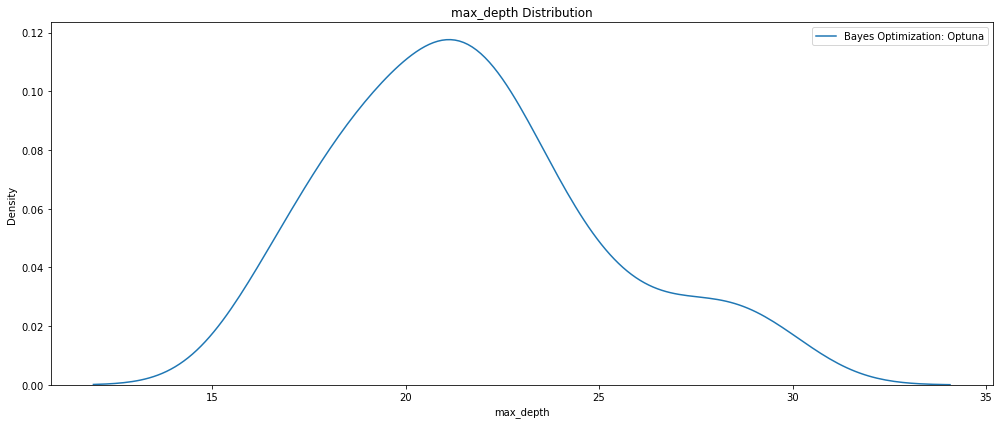

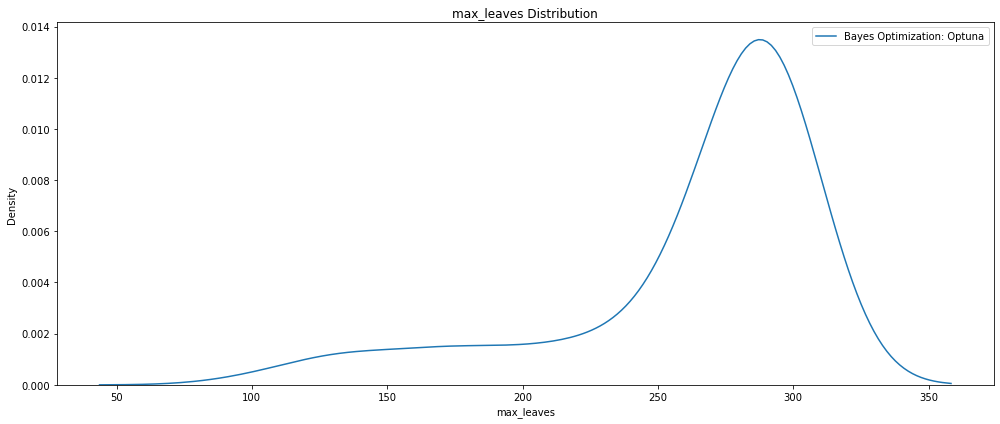

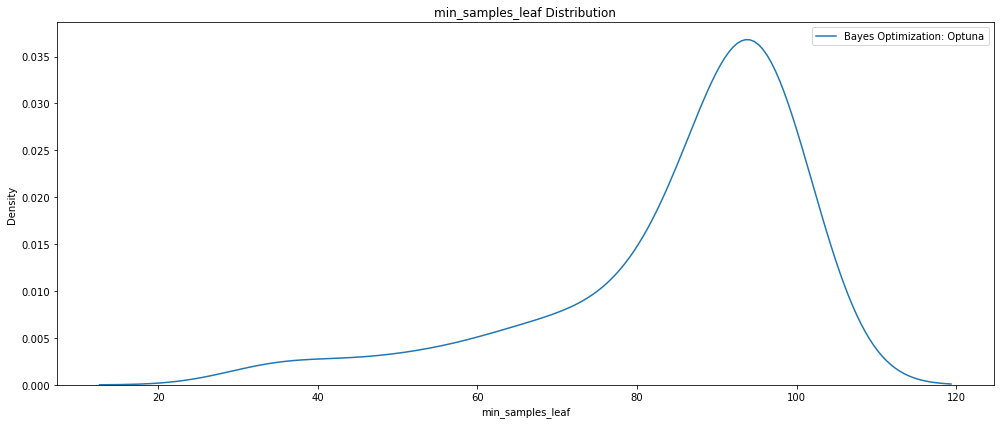

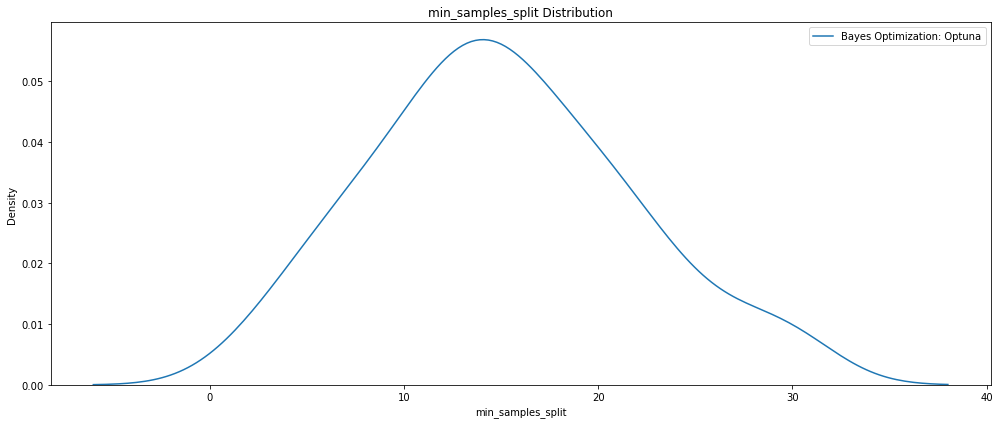

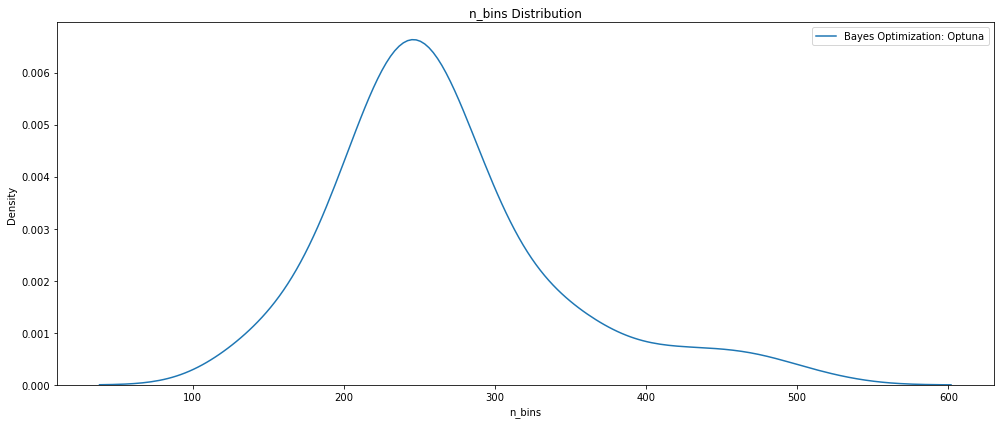

In [ ]:
# Create plots of Hyperparameters that are numeric 
for i, hpo in enumerate(trials_df.columns):
    if hpo not in ['iteration', 'rmse', 'datetime_start', 'datetime_complete',
                   'duration', 'n_estimators', 'state']:
        plt.figure(figsize=(14,6))
        # Plot the bayes search distribution
        if hpo != 'loss':
            sns.kdeplot(trials_df[hpo], label='Bayes Optimization: Optuna')
            plt.legend(loc=0)
            plt.title('{} Distribution'.format(hpo))
            plt.xlabel('{}'.format(hpo)); plt.ylabel('Density')
            plt.tight_layout()
            plt.show()

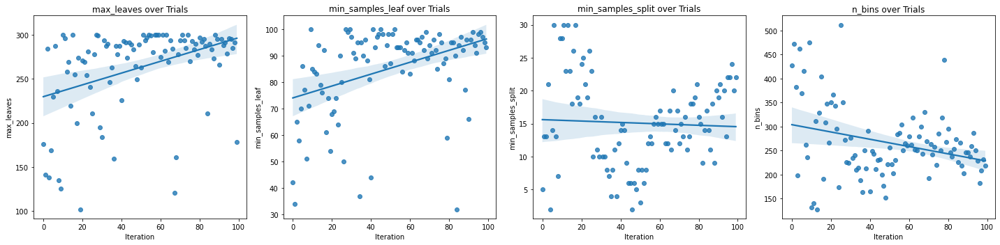

In [ ]:
# Plot quantitive hyperparameters
fig, axs = plt.subplots(1, 4, figsize=(20,5))
i = 0
axs = axs.flatten()
for i, hpo in enumerate(['max_leaves', 'min_samples_leaf', 'min_samples_split',
                         'n_bins']):
    # Scatterplot
    sns.regplot('iteration', hpo, data=trials_df, ax=axs[i]) 
    axs[i].set(xlabel='Iteration', ylabel='{}'.format(hpo), 
               title='{} over Trials'.format(hpo))
plt.tight_layout()
plt.show()

In [ ]:
# Write results to ML Results
%cd /notebooks/UsedCarsCarGurus/Models/ML/RF/Optuna/Model_Explanations/

/notebooks/UsedCarsCarGurus/Models/ML/RF/Optuna/Model_Explanations


In [ ]:
# Visualize parameter importances
fig = optuna.visualization.plot_param_importances(study)
py.plot(fig, filename='paramImportance_RF_Optuna_100_GPU.html')
fig.show()

In [ ]:
# Visualize empirical distribution function
fig = optuna.visualization.plot_edf(study)
py.plot(fig, filename='edf_RF_Optuna_100_GPU.html')
fig.show()

In [ ]:
# Arrange best parameters to fit model for model metrics
params = study.best_params   
params['random_state'] = seed_value
params

{'n_estimators': 198,
 'max_depth': 23,
 'max_leaves': 300,
 'min_samples_leaf': 98,
 'min_samples_split': 8,
 'n_bins': 221,
 'random_state': 42}

In [ ]:
# Write results to ML Results
%cd /notebooks/UsedCarsCarGurus/Models/ML/RF/Optuna/Model_PKL/

/notebooks/UsedCarsCarGurus/Models/ML/RF/Optuna/Model_PKL


In [ ]:
# Re-create the best model and train on the training data
best_model = RandomForestRegressor(n_streams=1, **params)

# Fit the model
best_model.fit(X_train, y_train)

# Save model
Pkl_Filename = 'RF_Optuna_trials100_GPU.pkl'  

with open(Pkl_Filename, 'wb') as file:  
    pickle.dump(best_model, file)

# =============================================================================
# # To load saved model
# model = joblib.load('RF_Optuna_trials100_GPU.pkl')
# print(model)
# =============================================================================

print('\nModel Metrics for RF HPO 100 GPU trials')
y_train_pred = best_model.predict(X_train)
y_test_pred = best_model.predict(X_test)

print('MAE train: %.3f, test: %.3f' % (
        mean_absolute_error(y_train.to_numpy(), y_train_pred.to_numpy()),
        mean_absolute_error(y_test.to_numpy(), y_test_pred.to_numpy())))
print('MSE train: %.3f, test: %.3f' % (
        mean_squared_error(y_train.to_numpy(), y_train_pred.to_numpy()),
        mean_squared_error(y_test.to_numpy(), y_test_pred.to_numpy())))
print('RMSE train: %.3f, test: %.3f' % (
        mean_squared_error(y_train.to_numpy(), y_train_pred.to_numpy(), 
                           squared=False),
        mean_squared_error(y_test.to_numpy(), y_test_pred.to_numpy(), 
                           squared=False)))
print('R^2 train: %.3f, test: %.3f' % (
        r2_score(y_train.to_numpy(), y_train_pred.to_numpy()),
        r2_score(y_test.to_numpy(), y_test_pred.to_numpy())))


Model Metrics for RF HPO 100 GPU trials
MAE train: 2668.898, test: 2686.669
MSE train: 12772463.450, test: 13025992.483
RMSE train: 3573.858, test: 3609.154
R^2 train: 0.861, test: 0.857


In [ ]:
# Evaluate on the testing data 
print('The best model from optimization scores {:.5f} MSE on the test set.'.format(mean_squared_error(y_test.to_numpy(), 
                                                                                                      y_test_pred.to_numpy())))
print('This was achieved using these conditions:')
print(trials_df.iloc[0])

The best model from optimization scores 13025992.48326 MSE on the test set.
This was achieved using these conditions:
iteration                                    51
rmse                                3609.153984
datetime_start       2023-02-24 23:54:43.082608
datetime_complete    2023-02-24 23:55:04.914943
duration                 0 days 00:00:21.832335
max_depth                                    23
max_leaves                                  300
min_samples_leaf                             98
min_samples_split                             8
n_bins                                      221
n_estimators                                198
state                                  COMPLETE
Name: 51, dtype: object


## 100 Trials Train/Test - Higher Parameters

In [ ]:
# Write results to ML Results
%cd /notebooks/UsedCarsCarGurus/Models/ML/RF/Optuna/Model_PKL

# Define a name for the trials
study_name = 'dask_optuna_rf_100_paramsHi_rmse_tpe'

/notebooks/UsedCarsCarGurus/Models/ML/RF/Optuna/Model_PKL


In [ ]:
# Define objective function with the parameters to be tested
def objective(trial, X_param, y_param):
    
    joblib.dump(study, 'RF_Optuna_100_GPU_paramsHi.pkl')
    
    # Search parameters 
    n_estimators = trial.suggest_int('n_estimators', 300, 1000) 
    max_depth = trial.suggest_int('max_depth', 30, 70) 
    max_leaves = trial.suggest_int('max_leaves', 300, 700) 
    min_samples_leaf = trial.suggest_int('min_samples_leaf', 70, 150)
    min_samples_split = trial.suggest_int('min_samples_split', 20, 70) 
    n_bins = trial.suggest_int('n_bins', 128, 512)
    
    score = train_and_eval(X_param,
                           y_param,
                           bootstrap=True, 
                           n_estimators=n_estimators,
                           max_depth=max_depth,
                           max_leaves=max_leaves, 
                           min_samples_leaf=min_samples_leaf,
                           min_samples_split=min_samples_split, 
                           n_bins=n_bins)

    return score

In [ ]:
with timed('dask_optuna'):
    # Begin HPO trials 
    # Start timer for experiment
    start_time = datetime.now()
    print('%-20s %s' % ('Start Time', start_time))
    if os.path.isfile('RF_Optuna_100_GPU_paramsHi.pkl'): 
        study = joblib.load('RF_Optuna_100_GPU_paramsHi.pkl')
    else: 
        study = optuna.create_study(sampler=optuna.samplers.TPESampler(), 
                                    study_name=study_name,
                                    direction='minimize')
      
    # Optimize in parallel on Dask cluster
    with parallel_backend('dask'):
        study.optimize(lambda trial: objective(trial, X_train, y_train), 
                       n_trials=100,
                       n_jobs=n_workers)

# End timer for experiment
end_time = datetime.now()
print('%-20s %s' % ('Start Time', start_time))
print('%-20s %s' % ('End Time', end_time))
print(str(timedelta(seconds=(end_time-start_time).seconds)))
print('\n')
print('Number of finished trials:', len(study.trials))
print('Best trial:', study.best_trial.params)
print('Lowest RMSE', study.best_value)

Start Time           2023-02-25 00:31:08.510241
- Trial RMSE: 3230.879072676439
- Trial RMSE: 3355.1694036130725
- Trial RMSE: 3610.735939029101
- Trial RMSE: 3186.901445965314
- Trial RMSE: 3169.579546903674
- Trial RMSE: 3088.353098877052
- Trial RMSE: 3308.4269201808675
- Trial RMSE: 3357.819095898403
- Trial RMSE: 3142.2102192043953
- Trial RMSE: 3236.327863056339
- Trial RMSE: 3088.436949152763
- Trial RMSE: 3092.275115910169
- Trial RMSE: 3122.138032036405
- Trial RMSE: 3145.4717407955613
- Trial RMSE: 3148.360436798352
- Trial RMSE: 3124.5959429784407
- Trial RMSE: 3497.0762566422586
- Trial RMSE: 3170.0604239016634
- Trial RMSE: 3235.5615541606116
- Trial RMSE: 3431.6660181663133
- Trial RMSE: 3211.6659186335514
- Trial RMSE: 3074.202531910096
- Trial RMSE: 3103.398304721883
- Trial RMSE: 3083.319902144554
- Trial RMSE: 3072.4694005535544
- Trial RMSE: 3130.9742823295906
- Trial RMSE: 3103.74381274264
- Trial RMSE: 3122.150963057446
- Trial RMSE: 3142.5742001898684
- Trial RMSE

In [ ]:
# Write results to ML Results
%cd /notebooks/UsedCarsCarGurus/Models/ML/RF/Optuna/trialOptions/

/notebooks/UsedCarsCarGurus/Models/ML/RF/Optuna/trialOptions


In [ ]:
# Output from HPO trials
trials_df = study.trials_dataframe()
trials_df.rename(columns={'number': 'iteration'}, inplace=True)
trials_df.rename(columns={'value': 'rmse'}, inplace=True)
trials_df.rename(columns={'params_max_depth': 'max_depth'}, inplace=True)
trials_df.rename(columns={'params_max_leaves': 'max_leaves'}, inplace=True)
trials_df.rename(columns={'params_min_samples_leaf': 'min_samples_leaf'}, 
                 inplace=True)
trials_df.rename(columns={'params_min_samples_split': 'min_samples_split'}, 
                 inplace=True)
trials_df.rename(columns={'params_n_bins': 'n_bins'}, inplace=True)
trials_df.rename(columns={'params_n_estimators': 'n_estimators'}, inplace=True)
trials_df = trials_df.sort_values('rmse', ascending=True)
print(trials_df) 

# Write processed data to csv
trials_df.to_csv('RF_Optuna_100_GPU_paramsHi.csv', index=False)

    iteration         rmse             datetime_start  \
45         45  3068.935029 2023-02-25 02:00:05.199252   
37         37  3069.210350 2023-02-25 01:40:19.876667   
95         95  3069.621160 2023-02-25 03:37:01.109754   
76         76  3070.658357 2023-02-25 02:54:17.150433   
88         88  3071.160790 2023-02-25 03:21:06.586860   
..        ...          ...                        ...   
75         75  3368.801109 2023-02-25 02:52:01.908794   
50         50  3394.017185 2023-02-25 02:06:48.049160   
19         19  3431.666018 2023-02-25 01:02:36.198843   
16         16  3497.076257 2023-02-25 00:56:55.849571   
2           2  3610.735939 2023-02-25 00:32:56.275884   

            datetime_complete               duration  max_depth  max_leaves  \
45 2023-02-25 02:01:30.633968 0 days 00:01:25.434716         59         699   
37 2023-02-25 01:42:57.617196 0 days 00:02:37.740529         62         699   
95 2023-02-25 03:39:23.641702 0 days 00:02:22.531948         59         693   

In [ ]:
# Write results to ML Results
%cd /notebooks/UsedCarsCarGurus/Models/ML/RF/Optuna/Model_Explanations/

/notebooks/UsedCarsCarGurus/Models/ML/RF/Optuna/Model_Explanations


In [ ]:
# Plot_optimization_history: shows the scores from all trials as well as the best score so far at each point.
fig = optuna.visualization.plot_optimization_history(study)
py.plot(fig, filename='optimizationHistory_RF_Optuna_100_GPU_paramsHi.html')
fig.show()

In [ ]:
# plot_parallel_coordinate: interactively visualizes the hyperparameters and scores
fig = optuna.visualization.plot_parallel_coordinate(study)
py.plot(fig, filename='parallelCoordinate_RF_Optuna_100_GPU_paramsHi.html')
fig.show()

In [ ]:
# plot_slice: shows the change of the hyperparamters space over the search. 
fig = optuna.visualization.plot_slice(study)
py.plot(fig, filename='slice_RF_Optuna_100_GPU_paramsHi.html')
fig.show()

In [ ]:
# plot_contour: plots parameter interactions on an interactive chart. 
fig = optuna.visualization.plot_contour(study, params=['max_leaves', 
                                                       'min_samples_leaf',
                                                       'max_depth', 
                                                       'min_samples_split'])
py.plot(fig, filename='contour_RF_Optuna_100_GPU_paramsHi.html')
fig.show()

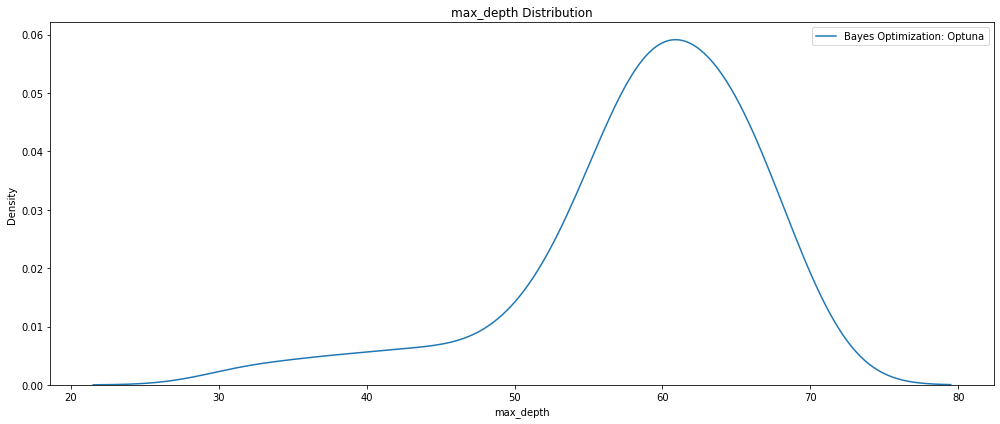

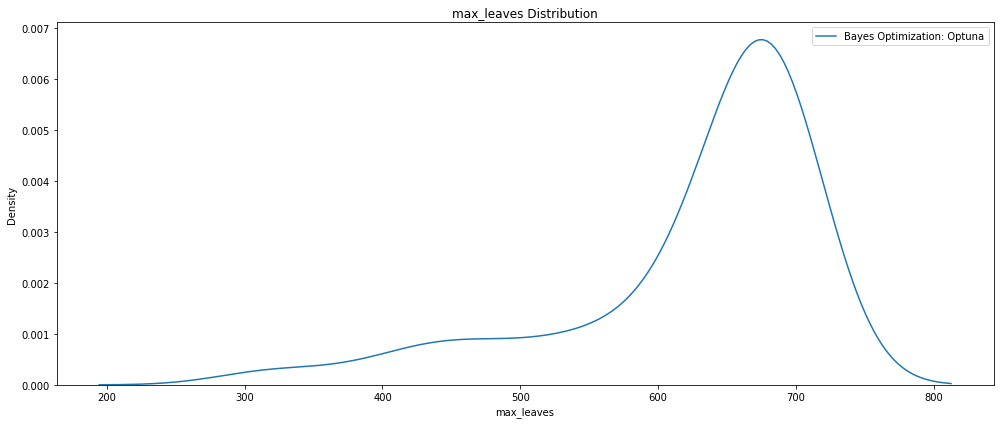

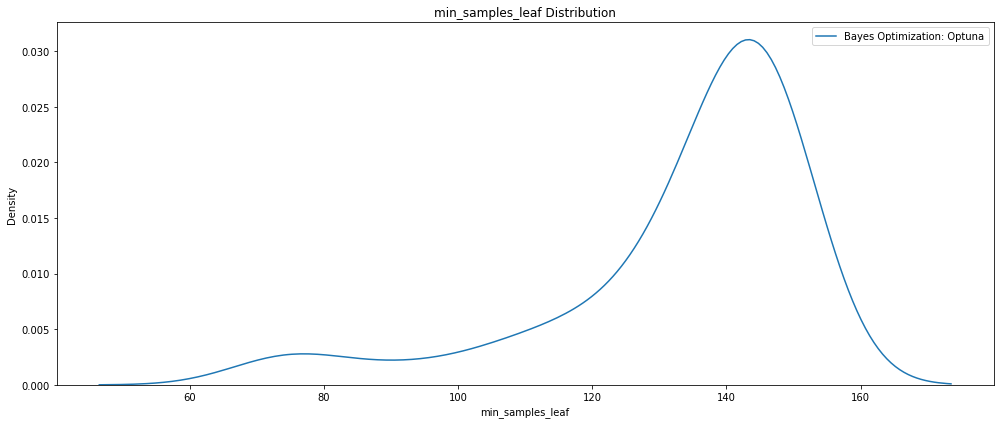

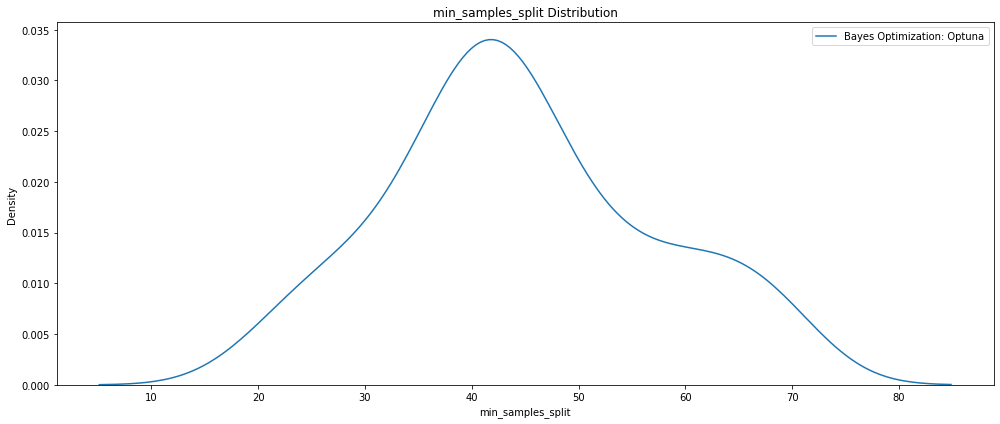

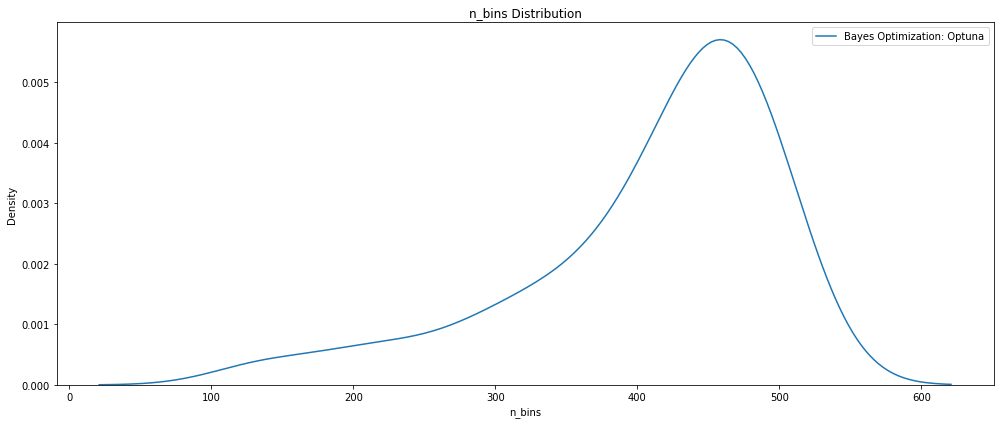

In [ ]:
# Create plots of Hyperparameters that are numeric 
for i, hpo in enumerate(trials_df.columns):
    if hpo not in ['iteration', 'rmse', 'datetime_start', 'datetime_complete',
                   'duration', 'n_estimators', 'state']:
        plt.figure(figsize=(14,6))
        # Plot the bayes search distribution
        if hpo != 'loss':
            sns.kdeplot(trials_df[hpo], label='Bayes Optimization: Optuna')
            plt.legend(loc=0)
            plt.title('{} Distribution'.format(hpo))
            plt.xlabel('{}'.format(hpo)); plt.ylabel('Density')
            plt.tight_layout()
            plt.show()

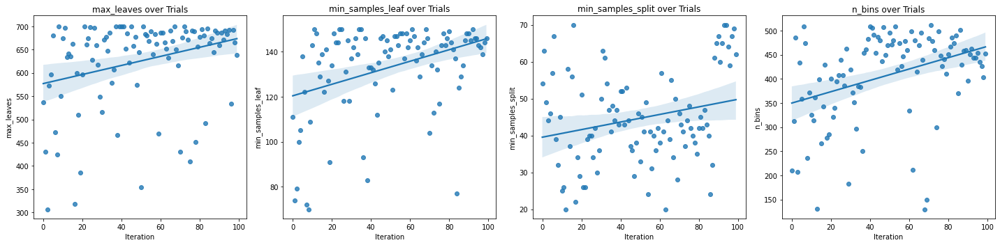

In [ ]:
# Plot quantitive hyperparameters
fig, axs = plt.subplots(1, 4, figsize=(20,5))
i = 0
axs = axs.flatten()
for i, hpo in enumerate(['max_leaves', 'min_samples_leaf', 'min_samples_split',
                         'n_bins']):
    # Scatterplot
    sns.regplot('iteration', hpo, data=trials_df, ax=axs[i]) 
    axs[i].set(xlabel='Iteration', ylabel='{}'.format(hpo), 
               title='{} over Trials'.format(hpo))
plt.tight_layout()
plt.show()

In [ ]:
# Visualize parameter importances
fig = optuna.visualization.plot_param_importances(study)
py.plot(fig, filename='paramImportance_RF_Optuna_100_GPU_paramsHi.html')
fig.show()

In [ ]:
# Visualize empirical distribution function
fig = optuna.visualization.plot_edf(study)
py.plot(fig, filename='edf_RF_Optuna_100_GPU_paramsHi.html')
fig.show()

In [ ]:
# Arrange best parameters to fit model for model metrics
params = study.best_params   
params['random_state'] = seed_value
params

{'n_estimators': 531,
 'max_depth': 59,
 'max_leaves': 699,
 'min_samples_leaf': 146,
 'min_samples_split': 37,
 'n_bins': 480,
 'random_state': 42}

In [ ]:
# Write results to ML Results
%cd /notebooks/UsedCarsCarGurus/Models/ML/RF/Optuna/Model_PKL

/notebooks/UsedCarsCarGurus/Models/ML/RF/Optuna/Model_PKL


In [ ]:
# Re-create the best model and train on the training data
best_model = RandomForestRegressor(n_streams=1, **params)

# Fit the model
best_model.fit(X_train, y_train)

# Save model
Pkl_Filename = 'RF_Optuna_trials100_GPU_paramsHi.pkl'  

with open(Pkl_Filename, 'wb') as file:  
    pickle.dump(best_model, file)

# =============================================================================
# # To load saved model
# model = joblib.load('RF_Optuna_trials100_GPU_paramsHi.pkl')
# print(model)
# =============================================================================

print('\nModel Metrics for RF HPO 100 GPU trials')
y_train_pred = best_model.predict(X_train)
y_test_pred = best_model.predict(X_test)

print('MAE train: %.3f, test: %.3f' % (
        mean_absolute_error(y_train.to_numpy(), y_train_pred.to_numpy()),
        mean_absolute_error(y_test.to_numpy(), y_test_pred.to_numpy())))
print('MSE train: %.3f, test: %.3f' % (
        mean_squared_error(y_train.to_numpy(), y_train_pred.to_numpy()),
        mean_squared_error(y_test.to_numpy(), y_test_pred.to_numpy())))
print('RMSE train: %.3f, test: %.3f' % (
        mean_squared_error(y_train.to_numpy(), y_train_pred.to_numpy(), 
                           squared=False),
        mean_squared_error(y_test.to_numpy(), y_test_pred.to_numpy(), 
                           squared=False)))
print('R^2 train: %.3f, test: %.3f' % (
        r2_score(y_train.to_numpy(), y_train_pred.to_numpy()),
        r2_score(y_test.to_numpy(), y_test_pred.to_numpy())))


Model Metrics for RF HPO 100 GPU trials
MAE train: 2283.815, test: 2283.815
MSE train: 9418362.214, test: 9418362.214
RMSE train: 3068.935, test: 3068.935
R^2 train: 0.897, test: 0.897


In [ ]:
# Evaluate on the testing data 
print('The best model from optimization scores {:.5f} MSE on the test set.'.format(mean_squared_error(y_test.to_numpy(), 
                                                                                                      y_test_pred.to_numpy())))
print('This was achieved using these conditions:')
print(trials_df.iloc[0])

The best model from optimization scores 9418362.21357 MSE on the test set.
This was achieved using these conditions:
iteration                                    45
rmse                                3068.935029
datetime_start       2023-02-25 02:00:05.199252
datetime_complete    2023-02-25 02:01:30.633968
duration                 0 days 00:01:25.434716
max_depth                                    59
max_leaves                                  699
min_samples_leaf                            146
min_samples_split                            37
n_bins                                      480
n_estimators                                531
state                                  COMPLETE
Name: 45, dtype: object


## 300 Trials Train/Test - Higher Parameters

In [ ]:
# Write results to ML Results
%cd /notebooks/UsedCarsCarGurus/Models/ML/RF/Optuna/Model_PKL

# Define a name for the trials
study_name = 'dask_optuna_rf_300_paramsHi_rmse_tpe'

/notebooks/UsedCarsCarGurus/Models/ML/RF/Optuna/Model_PKL


In [ ]:
# Define objective function with the parameters to be tested
def objective(trial, X_param, y_param):
    
    joblib.dump(study, 'RF_Optuna_300_GPU_paramsHi.pkl')
    
    # Search parameters
    n_estimators = trial.suggest_int('n_estimators', 500, 1500) 
    max_depth = trial.suggest_int('max_depth', 40, 150) 
    max_leaves = trial.suggest_int('max_leaves', 650, 1500) 
    min_samples_leaf = trial.suggest_int('min_samples_leaf', 120, 200)
    min_samples_split = trial.suggest_int('min_samples_split', 25, 100) 
    n_bins = trial.suggest_int('n_bins', 200, 700)
    
    score = train_and_eval(X_param,
                           y_param,
                           bootstrap=True, 
                           n_estimators=n_estimators,
                           max_depth=max_depth,
                           max_leaves=max_leaves, 
                           min_samples_leaf=min_samples_leaf,
                           min_samples_split=min_samples_split, 
                           n_bins=n_bins)

    return score

In [ ]:
with timed('dask_optuna'):
    # Begin HPO trials 
    # Start timer for experiment
    start_time = datetime.now()
    print('%-20s %s' % ('Start Time', start_time))
    if os.path.isfile('RF_Optuna_300_GPU_paramsHi.pkl'): 
        study = joblib.load('RF_Optuna_300_GPU_paramsHi.pkl')
    else: 
        study = optuna.create_study(sampler=optuna.samplers.TPESampler(), 
                                    study_name=study_name,
                                    direction='minimize')
      
    # Optimize in parallel on Dask cluster
    with parallel_backend('dask'):
        study.optimize(lambda trial: objective(trial, X_train, y_train), 
                       n_trials=300,
                       n_jobs=n_workers)

# End timer for experiment
end_time = datetime.now()
print('%-20s %s' % ('Start Time', start_time))
print('%-20s %s' % ('End Time', end_time))
print(str(timedelta(seconds=(end_time-start_time).seconds)))
print('\n')
print('Number of finished trials:', len(study.trials))
print('Best trial:', study.best_trial.params)
print('Lowest RMSE', study.best_value)

Start Time           2023-02-25 00:27:44.112035
- Trial RMSE: 3070.5515393258265
- Trial RMSE: 3004.502768033548
- Trial RMSE: 2992.838374169728
- Trial RMSE: 2952.6377917110103
- Trial RMSE: 2999.504224547878
- Trial RMSE: 2959.711170671458
- Trial RMSE: 2915.657389385467
- Trial RMSE: 2931.64873430972
- Trial RMSE: 3003.9068260271165
- Trial RMSE: 3059.592102718374
- Trial RMSE: 2970.32430936034
- Trial RMSE: 2937.7590628066164
- Trial RMSE: 2936.324048275951
- Trial RMSE: 2888.127200696442
- Trial RMSE: 2920.77211599012
- Trial RMSE: 2895.218873010557
- Trial RMSE: 2919.1211240213765
- Trial RMSE: 2884.48397046072
- Trial RMSE: 2935.465644570855
- Trial RMSE: 2880.884986581975
- Trial RMSE: 2853.4185282421467
- Trial RMSE: 2849.3526302271707
- Trial RMSE: 2851.988378562596
- Trial RMSE: 2882.567411704896
- Trial RMSE: 2846.7028629236493
- Trial RMSE: 2858.7965992972513
- Trial RMSE: 2865.218263604923
- Trial RMSE: 2853.1618453102233
- Trial RMSE: 2849.7002421500442
- Trial RMSE: 287

In [ ]:
# Load to continue training
study = joblib.load('RF_Optuna_300_GPU_paramsHi.pkl')

print('Number of finished trials:', len(study.trials))
print('Best trial:', study.best_trial.params)
print('Lowest RMSE', study.best_value)

Number of finished trials: 76
Best trial: {'n_estimators': 1233, 'max_depth': 94, 'max_leaves': 1499, 'min_samples_leaf': 123, 'min_samples_split': 60, 'n_bins': 492}
Lowest RMSE 2837.222121193426


In [ ]:
with timed('dask_optuna'):
    # Begin HPO trials 
    # Start timer for experiment
    start_time = datetime.now()
    print('%-20s %s' % ('Start Time', start_time))
    if os.path.isfile('RF_Optuna_300_GPU_paramsHi.pkl'): 
        study = joblib.load('RF_Optuna_300_GPU_paramsHi.pkl')
    else: 
        study = optuna.create_study(sampler=optuna.samplers.TPESampler(), 
                                    study_name=study_name,
                                    direction='minimize')
      
    # Optimize in parallel on Dask cluster
    with parallel_backend('dask'):
        study.optimize(lambda trial: objective(trial, X_train, y_train), 
                       n_trials=425,
                       n_jobs=n_workers)

# End timer for experiment
end_time = datetime.now()
print('%-20s %s' % ('Start Time', start_time))
print('%-20s %s' % ('End Time', end_time))
print(str(timedelta(seconds=(end_time-start_time).seconds)))
print('\n')
print('Number of finished trials:', len(study.trials))
print('Best trial:', study.best_trial.params)
print('Lowest RMSE', study.best_value)

Start Time           2023-02-25 05:30:24.813789
- Trial RMSE: 2835.540530672409
- Trial RMSE: 2847.8142159155855
- Trial RMSE: 2857.2494554297823
- Trial RMSE: 2847.1353311565235
- Trial RMSE: 2853.00175676189
- Trial RMSE: 2867.0407079223132
- Trial RMSE: 2846.8330274412456
- Trial RMSE: 2838.004166429222
- Trial RMSE: 2836.301976200423
- Trial RMSE: 2847.432050867665
- Trial RMSE: 2842.8682965602757
- Trial RMSE: 2858.408625230785
- Trial RMSE: 2843.5955617727645
- Trial RMSE: 2937.756485567085
- Trial RMSE: 2856.2560204481174
- Trial RMSE: 2837.0054179785097
- Trial RMSE: 2845.65082163338
- Trial RMSE: 2842.206688872409
- Trial RMSE: 2845.85828330558
- Trial RMSE: 2842.228532801479
- Trial RMSE: 2851.3908921510565
- Trial RMSE: 2837.574352600194
- Trial RMSE: 2853.605458367723
- Trial RMSE: 3147.4665253213407
- Trial RMSE: 2859.8218134565836
- Trial RMSE: 2842.6112030649333
- Trial RMSE: 2837.0212686020627
- Trial RMSE: 2848.2349766474417
- Trial RMSE: 2842.55290659121
- Trial RMSE:

In [ ]:
# Load to continue training
study = joblib.load('RF_Optuna_300_GPU_paramsHi.pkl')

print('Number of finished trials:', len(study.trials))
print('Best trial:', study.best_trial.params)
print('Lowest RMSE', study.best_value)

Number of finished trials: 161
Best trial: {'n_estimators': 1086, 'max_depth': 87, 'max_leaves': 1498, 'min_samples_leaf': 120, 'min_samples_split': 48, 'n_bins': 616}
Lowest RMSE 2834.814140775849


In [ ]:
with timed('dask_optuna'):
    # Begin HPO trials 
    # Start timer for experiment
    start_time = datetime.now()
    print('%-20s %s' % ('Start Time', start_time))
    if os.path.isfile('RF_Optuna_300_GPU_paramsHi.pkl'): 
        study = joblib.load('RF_Optuna_300_GPU_paramsHi.pkl')
    else: 
        study = optuna.create_study(sampler=optuna.samplers.TPESampler(), 
                                    study_name=study_name,
                                    direction='minimize')
      
    # Optimize in parallel on Dask cluster
    with parallel_backend('dask'):
        study.optimize(lambda trial: objective(trial, X_train, y_train), 
                       n_trials=140,
                       n_jobs=n_workers)

# End timer for experiment
end_time = datetime.now()
print('%-20s %s' % ('Start Time', start_time))
print('%-20s %s' % ('End Time', end_time))
print(str(timedelta(seconds=(end_time-start_time).seconds)))
print('\n')
print('Number of finished trials:', len(study.trials))
print('Best trial:', study.best_trial.params)
print('Lowest RMSE', study.best_value)

Start Time           2023-02-25 16:22:39.789350
- Trial RMSE: 2848.1757489808683
- Trial RMSE: 2840.89946983449
- Trial RMSE: 2853.7174942870934
- Trial RMSE: 2841.6537219301385
- Trial RMSE: 2838.448740979785
- Trial RMSE: 2842.9254149544104
- Trial RMSE: 2840.065117014244
- Trial RMSE: 2845.974480425662
- Trial RMSE: 2839.8795007767217
- Trial RMSE: 2846.331429071481
- Trial RMSE: 2842.731314550256
- Trial RMSE: 2841.161051813546
- Trial RMSE: 2849.8665215399346
- Trial RMSE: 2837.756776510394
- Trial RMSE: 2846.0024559259414
- Trial RMSE: 2834.093270955215
- Trial RMSE: 2857.9916444185906
- Trial RMSE: 2844.0535496514217
- Trial RMSE: 2873.1560117042386
- Trial RMSE: 2840.024356797726
- Trial RMSE: 2845.2691276401065
- Trial RMSE: 2847.1450588907232
- Trial RMSE: 2843.2373175910125
- Trial RMSE: 2843.967795264734
- Trial RMSE: 2837.680017655746
- Trial RMSE: 2842.364531257587
- Trial RMSE: 2845.1228831671147
- Trial RMSE: 2844.8139127101717
- Trial RMSE: 2842.670923268067
- Trial RM

In [ ]:
# Load to continue training
study = joblib.load('RF_Optuna_300_GPU_paramsHi.pkl')
    
print('Number of finished trials:', len(study.trials))
print('Best trial:', study.best_trial.params)
print('Lowest RMSE', study.best_value)

Number of finished trials: 246
Best trial: {'n_estimators': 1303, 'max_depth': 96, 'max_leaves': 1499, 'min_samples_leaf': 120, 'min_samples_split': 59, 'n_bins': 506}
Lowest RMSE 2834.093270955215


In [ ]:
with timed('dask_optuna'):
    # Begin HPO trials 
    # Start timer for experiment
    start_time = datetime.now()
    print('%-20s %s' % ('Start Time', start_time))
    if os.path.isfile('RF_Optuna_300_GPU_paramsHi.pkl'): 
        study = joblib.load('RF_Optuna_300_GPU_paramsHi.pkl')
    else: 
        study = optuna.create_study(sampler=optuna.samplers.TPESampler(), 
                                    study_name=study_name,
                                    direction='minimize')
      
    # Optimize in parallel on Dask cluster
    with parallel_backend('dask'):
        study.optimize(lambda trial: objective(trial, X_train, y_train), 
                       n_trials=55,
                       n_jobs=n_workers)

# End timer for experiment
end_time = datetime.now()
print('%-20s %s' % ('Start Time', start_time))
print('%-20s %s' % ('End Time', end_time))
print(str(timedelta(seconds=(end_time-start_time).seconds)))
print('\n')
print('Number of finished trials:', len(study.trials))
print('Best trial:', study.best_trial.params)
print('Lowest RMSE', study.best_value)

Start Time           2023-02-25 22:25:50.135139
- Trial RMSE: 2834.3933541239876
- Trial RMSE: 2840.1587884040628
- Trial RMSE: 2834.375469870116
- Trial RMSE: 2891.1596418958643
- Trial RMSE: 2840.061559209494
- Trial RMSE: 2846.7374644336523
- Trial RMSE: 2843.0405143085413
- Trial RMSE: 2839.1452424698796
- Trial RMSE: 2842.306593274908
- Trial RMSE: 2848.4967245938615
- Trial RMSE: 2834.367930817848
- Trial RMSE: 2842.754515719182
- Trial RMSE: 2849.806419002043
- Trial RMSE: 2840.8180166604825
- Trial RMSE: 2837.973089206591
- Trial RMSE: 2847.4634680373224
- Trial RMSE: 2844.2544012709664
- Trial RMSE: 2955.583590073496
- Trial RMSE: 2839.8654250739028
- Trial RMSE: 2841.8512727456455
- Trial RMSE: 2838.7685242296197
- Trial RMSE: 2852.0780472103897
- Trial RMSE: 2843.6535448834047
- Trial RMSE: 2920.503955772527
- Trial RMSE: 2838.234280654828
- Trial RMSE: 2837.884264517797
- Trial RMSE: 2847.4916127657943
- Trial RMSE: 2837.3085771094825
- Trial RMSE: 2836.8417226652077
- Tria

In [ ]:
# Write results to ML Results
%cd /notebooks/UsedCarsCarGurus/Models/ML/RF/Optuna/trialOptions/

/notebooks/UsedCarsCarGurus/Models/ML/RF/Optuna/trialOptions


In [ ]:
# Output from HPO trials
trials_df = study.trials_dataframe()
trials_df.rename(columns={'number': 'iteration'}, inplace=True)
trials_df.rename(columns={'value': 'rmse'}, inplace=True)
trials_df.rename(columns={'params_max_depth': 'max_depth'}, inplace=True)
trials_df.rename(columns={'params_max_leaves': 'max_leaves'}, inplace=True)
trials_df.rename(columns={'params_min_samples_leaf': 'min_samples_leaf'}, 
                 inplace=True)
trials_df.rename(columns={'params_min_samples_split': 'min_samples_split'}, 
                 inplace=True)
trials_df.rename(columns={'params_n_bins': 'n_bins'}, inplace=True)
trials_df.rename(columns={'params_n_estimators': 'n_estimators'}, inplace=True)
trials_df = trials_df.sort_values('rmse', ascending=True)
print(trials_df) 

# Write processed data to csv
trials_df.to_csv('RF_Optuna_300_GPU_paramsHi.csv', index=False)

     iteration         rmse             datetime_start  \
176        176  2834.093271 2023-02-25 17:27:00.963515   
256        256  2834.367931 2023-02-25 23:08:40.063723   
248        248  2834.375470 2023-02-25 22:34:43.793455   
246        246  2834.393354 2023-02-25 22:25:50.177505   
284        284  2834.771373 2023-02-26 01:09:54.346843   
..         ...          ...                        ...   
33          33  3157.361671 2023-02-25 02:21:14.014342   
75          75          NaN 2023-02-25 05:06:36.850373   
76          76          NaN 2023-02-25 05:30:00.324716   
160        160          NaN 2023-02-25 11:21:49.688151   
245        245          NaN 2023-02-25 22:15:02.325969   

             datetime_complete               duration  max_depth  max_leaves  \
176 2023-02-25 17:31:16.610885 0 days 00:04:15.647370       96.0      1499.0   
256 2023-02-25 23:12:42.063064 0 days 00:04:01.999341       93.0      1500.0   
248 2023-02-25 22:39:00.075889 0 days 00:04:16.282434       97.

In [ ]:
# Write results to ML Results
%cd /notebooks/UsedCarsCarGurus/Models/ML/RF/Optuna/Model_Explanations/

/notebooks/UsedCarsCarGurus/Models/ML/RF/Optuna/Model_Explanations


In [ ]:
# Plot_optimization_history: shows the scores from all trials as well as the best score so far at each point.
fig = optuna.visualization.plot_optimization_history(study)
py.plot(fig, filename='optimizationHistory_RF_Optuna_300_GPU_paramsHi.html')
fig.show()

In [ ]:
# plot_parallel_coordinate: interactively visualizes the hyperparameters and scores
fig = optuna.visualization.plot_parallel_coordinate(study)
py.plot(fig, filename='parallelCoordinate_RF_Optuna_300_GPU_paramsHi.html')
fig.show()

In [ ]:
# plot_slice: shows the change of the hyperparamters space over the search. 
fig = optuna.visualization.plot_slice(study)
py.plot(fig, filename='slice_RF_Optuna_300_GPU_paramsHi.html')
fig.show()

In [ ]:
# plot_contour: plots parameter interactions on an interactive chart. 
fig = optuna.visualization.plot_contour(study, params=['max_leaves', 
                                                       'min_samples_leaf',
                                                       'max_depth', 
                                                       'min_samples_split'])
py.plot(fig, filename='contour_RF_Optuna_300_GPU_paramsHi.html')
fig.show()

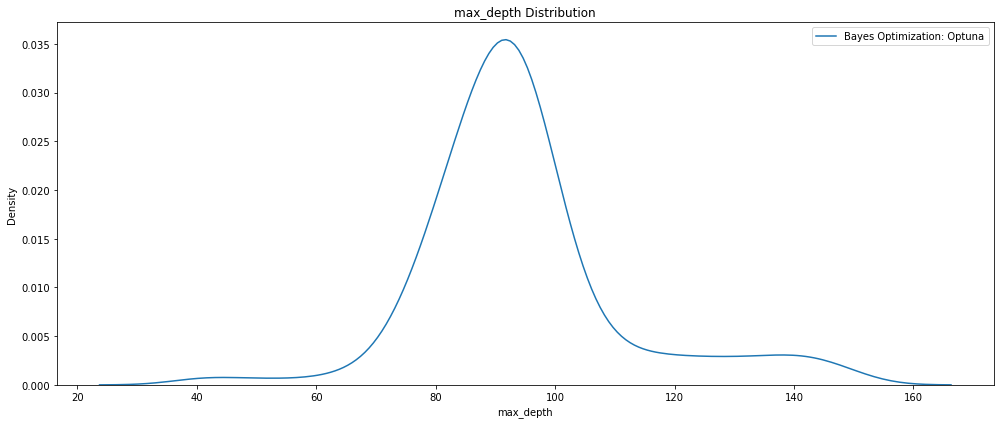

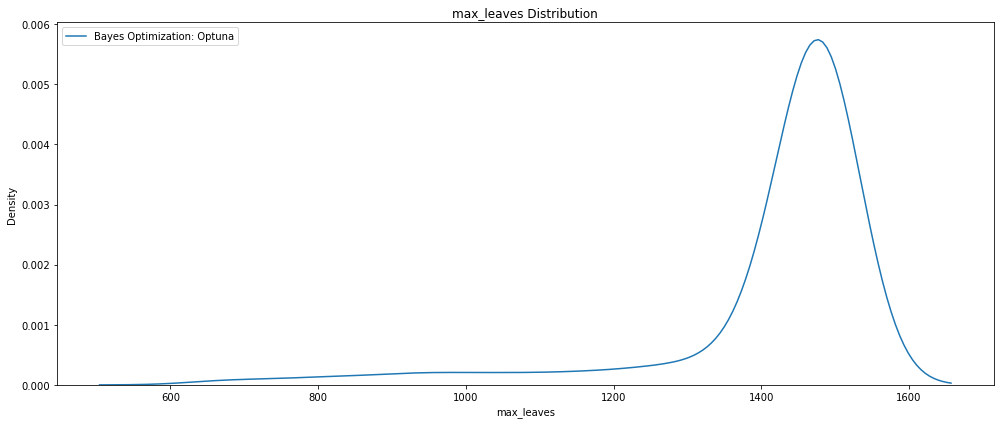

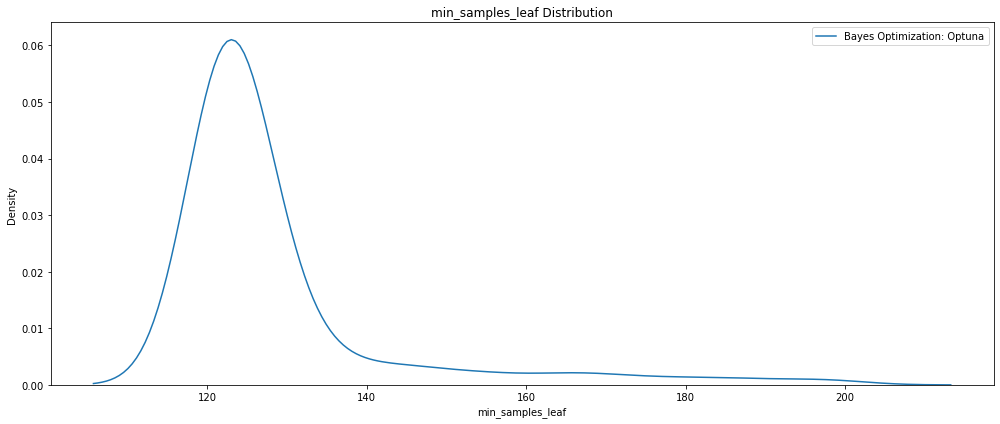

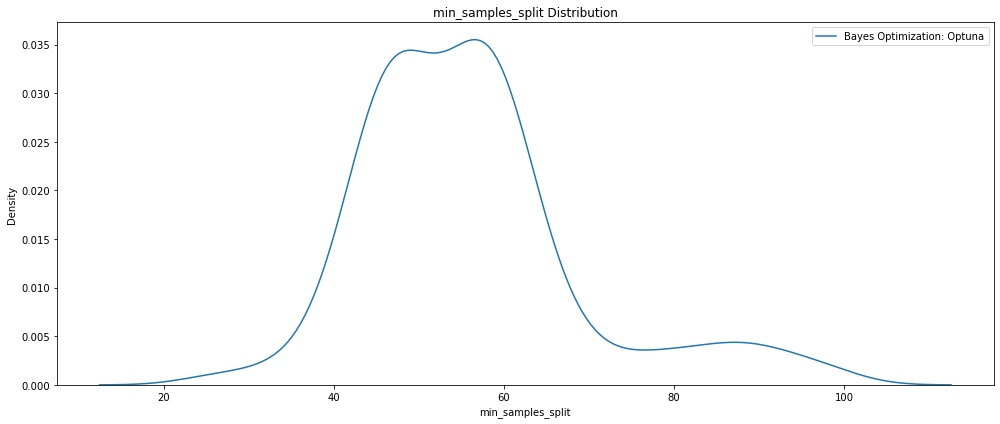

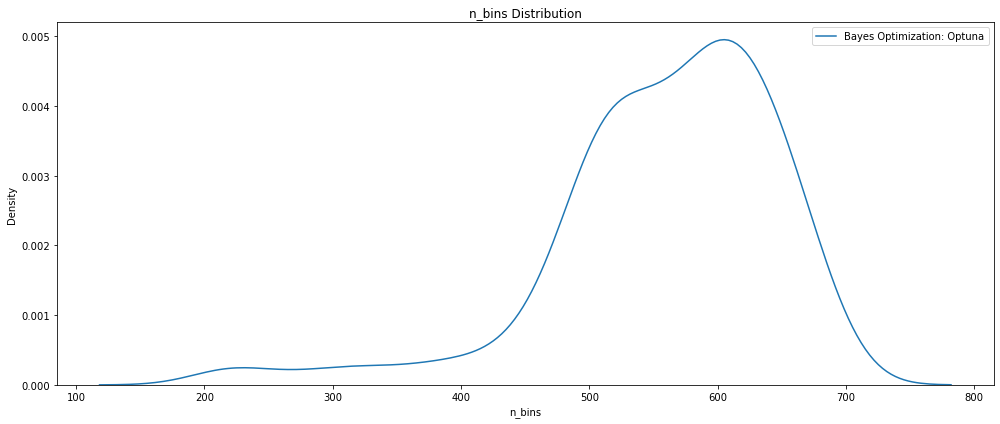

In [ ]:
# Create plots of Hyperparameters that are numeric 
for i, hpo in enumerate(trials_df.columns):
    if hpo not in ['iteration', 'rmse', 'datetime_start', 'datetime_complete',
                   'duration', 'n_estimators', 'state']:
        plt.figure(figsize=(14,6))
        # Plot the bayes search distribution
        if hpo != 'loss':
            sns.kdeplot(trials_df[hpo], label='Bayes Optimization: Optuna')
            plt.legend(loc=0)
            plt.title('{} Distribution'.format(hpo))
            plt.xlabel('{}'.format(hpo)); plt.ylabel('Density')
            plt.tight_layout()
            plt.show()

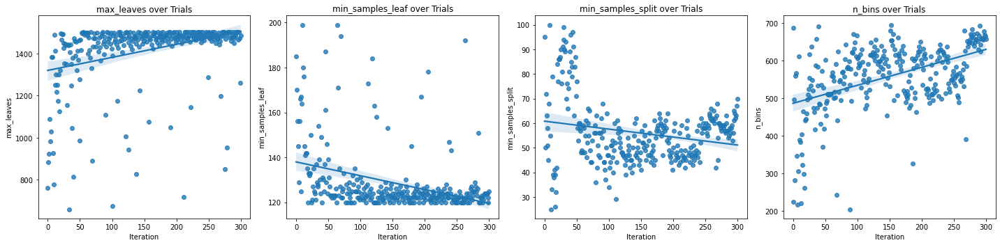

In [ ]:
# Plot quantitive hyperparameters
fig, axs = plt.subplots(1, 4, figsize=(20,5))
i = 0
axs = axs.flatten()
for i, hpo in enumerate(['max_leaves', 'min_samples_leaf', 'min_samples_split',
                         'n_bins']):
    # Scatterplot
    sns.regplot('iteration', hpo, data=trials_df, ax=axs[i]) 
    axs[i].set(xlabel='Iteration', ylabel='{}'.format(hpo), 
               title='{} over Trials'.format(hpo))
plt.tight_layout()
plt.show()

In [ ]:
# Visualize parameter importances
fig = optuna.visualization.plot_param_importances(study)
py.plot(fig, filename='paramImportance_RF_Optuna_300_GPU_paramsHi.html')
fig.show()

In [ ]:
# Visualize empirical distribution function
fig = optuna.visualization.plot_edf(study)
py.plot(fig, filename='edf_RF_Optuna_300_GPU_paramsHi.html')
fig.show()

In [ ]:
# Arrange best parameters to fit model for model metrics
params = study.best_params   
params['random_state'] = seed_value
params

{'n_estimators': 1303,
 'max_depth': 96,
 'max_leaves': 1499,
 'min_samples_leaf': 120,
 'min_samples_split': 59,
 'n_bins': 506,
 'random_state': 42}

In [ ]:
# Write results to ML Results
%cd /notebooks/UsedCarsCarGurus/Models/ML/RF/Optuna/Model_PKL/

/notebooks/UsedCarsCarGurus/Models/ML/RF/Optuna/Model_PKL


In [ ]:
# Re-create the best model and train on the training data
best_model = RandomForestRegressor(n_streams=1, **params)

# Fit the model
best_model.fit(X_train, y_train)

# Save model
Pkl_Filename = 'RF_Optuna_trials500_GPU_paramsHi.pkl'  

with open(Pkl_Filename, 'wb') as file:  
    pickle.dump(best_model, file)

# =============================================================================
# # To load saved model
# model = joblib.load('RF_Optuna_trials500_GPU_paramsHi.pkl')
# print(model)
# =============================================================================

print('\nModel Metrics for RF HPO 500 GPU trials')
y_train_pred = best_model.predict(X_train)
y_test_pred = best_model.predict(X_test)

print('MAE train: %.3f, test: %.3f' % (
        mean_absolute_error(y_train.to_numpy(), y_train_pred.to_numpy()),
        mean_absolute_error(y_test.to_numpy(), y_test_pred.to_numpy())))
print('MSE train: %.3f, test: %.3f' % (
        mean_squared_error(y_train.to_numpy(), y_train_pred.to_numpy()),
        mean_squared_error(y_test.to_numpy(), y_test_pred.to_numpy())))
print('RMSE train: %.3f, test: %.3f' % (
        mean_squared_error(y_train.to_numpy(), y_train_pred.to_numpy(), 
                           squared=False),
        mean_squared_error(y_test.to_numpy(), y_test_pred.to_numpy(), 
                           squared=False)))
print('R^2 train: %.3f, test: %.3f' % (
        r2_score(y_train.to_numpy(), y_train_pred.to_numpy()),
        r2_score(y_test.to_numpy(), y_test_pred.to_numpy())))


Model Metrics for RF HPO 500 GPU trials
MAE train: 2064.596, test: 2108.859
MSE train: 7657266.900, test: 8032084.668
RMSE train: 2767.177, test: 2834.093
R^2 train: 0.917, test: 0.912


In [ ]:
# Evaluate on the testing data 
print('The best model from optimization scores {:.5f} MSE on the test set.'.format(mean_squared_error(y_test.to_numpy(), 
                                                                                                      y_test_pred.to_numpy())))
print('This was achieved using these conditions:')
print(trials_df.iloc[0])

The best model from optimization scores 8032084.66847 MSE on the test set.
This was achieved using these conditions:
iteration                                   176
rmse                                2834.093271
datetime_start       2023-02-25 17:27:00.963515
datetime_complete    2023-02-25 17:31:16.610885
duration                 0 days 00:04:15.647370
max_depth                                  96.0
max_leaves                               1499.0
min_samples_leaf                          120.0
min_samples_split                          59.0
n_bins                                    506.0
n_estimators                             1303.0
state                                  COMPLETE
Name: 176, dtype: object


## 300 Trials Train/Test - Highest Parameters

In [ ]:
# Write results to ML Results
%cd /notebooks/UsedCarsCarGurus/Models/ML/RF/Optuna/Model_PKL

# Define a name for the trials
study_name = 'dask_optuna_rf_300_paramsHi2_rmse_tpe'

/notebooks/UsedCarsCarGurus/Models/ML/RF/Optuna/Model_PKL


In [ ]:
# Define objective function with the parameters to be tested
def objective(trial, X_param, y_param):
    
    joblib.dump(study, 'RF_Optuna_300_GPU_paramsHi2.pkl')
    
    # Search parameters
    n_estimators = trial.suggest_int('n_estimators', 500, 2000) 
    max_depth = trial.suggest_int('max_depth', 40, 200) 
    max_leaves = trial.suggest_int('max_leaves', 650, 2000) 
    min_samples_leaf = trial.suggest_int('min_samples_leaf', 120, 300)
    min_samples_split = trial.suggest_int('min_samples_split', 25, 200) 
    n_bins = trial.suggest_int('n_bins', 200, 1000)
    
    score = train_and_eval(X_param,
                           y_param,
                           bootstrap=True, 
                           n_estimators=n_estimators,
                           max_depth=max_depth,
                           max_leaves=max_leaves, 
                           min_samples_leaf=min_samples_leaf,
                           min_samples_split=min_samples_split, 
                           n_bins=n_bins)

    return score

In [ ]:
# Begin HPO trials 
# Start timer for experiment
with timed('dask_optuna'):
    # Begin HPO trials 
    # Start timer for experiment
    search_time_start = time.time()
    if os.path.isfile('RF_Optuna_300_GPU_paramsHi2.pkl'): 
        study = joblib.load('RF_Optuna_300_GPU_paramsHi2.pkl')
    else: 
        study = optuna.create_study(sampler=optuna.samplers.TPESampler(), 
                                    study_name=study_name,
                                    direction='minimize')
      
    # Optimize in parallel on Dask cluster
    with parallel_backend('dask'):
        study.optimize(lambda trial: objective(trial, X_train, y_train), 
                       n_trials=300,
                       n_jobs=n_workers)

# End timer for experiment
print('\n')
print('Time to run HPO:', time.time() - search_time_start)
print('Number of finished trials:', len(study.trials))
print('Best trial:', study.best_trial.params)
print('Lowest RMSE', study.best_value)

- Trial RMSE: 2886.474151565962
- Trial RMSE: 2964.063069396161
- Trial RMSE: 2933.0695806604976
- Trial RMSE: 2890.8854762563656
- Trial RMSE: 2928.4314950240864
- Trial RMSE: 2796.4543361848187
- Trial RMSE: 2929.2025224911795
- Trial RMSE: 3024.749206072762
- Trial RMSE: 2908.9954644542863
- Trial RMSE: 3079.6272278432616
- Trial RMSE: 3073.6200285765026
- Trial RMSE: 2847.8275975144297
- Trial RMSE: 2841.1465771404028
- Trial RMSE: 2830.4200603666204
- Trial RMSE: 2835.7188441430203
- Trial RMSE: 2970.173686603002
- Trial RMSE: 2970.367300510089
- Trial RMSE: 2826.476177456743
- Trial RMSE: 2852.493956133486
- Trial RMSE: 2888.8958899677464
- Trial RMSE: 2772.819509562674
- Trial RMSE: 2777.505966931902
- Trial RMSE: 2767.971238460787
- Trial RMSE: 2768.5326133845156
- Trial RMSE: 2806.0003507887063
- Trial RMSE: 2799.9931683885547
- Trial RMSE: 2866.577607625291
- Trial RMSE: 2974.425225912445
- Trial RMSE: 2771.744599871786
- Trial RMSE: 2787.355118478196
- Trial RMSE: 2908.79637

In [ ]:
# Write results to ML Results
%cd /notebooks/UsedCarsCarGurus/Models/ML/RF/Optuna/trialOptions/

/notebooks/UsedCarsCarGurus/Models/ML/RF/Optuna/trialOptions


In [ ]:
# Output from HPO trials
trials_df = study.trials_dataframe()
trials_df.rename(columns={'number': 'iteration'}, inplace=True)
trials_df.rename(columns={'value': 'rmse'}, inplace=True)
trials_df.rename(columns={'params_max_depth': 'max_depth'}, inplace=True)
trials_df.rename(columns={'params_max_leaves': 'max_leaves'}, inplace=True)
trials_df.rename(columns={'params_min_samples_leaf': 'min_samples_leaf'}, 
                 inplace=True)
trials_df.rename(columns={'params_min_samples_split': 'min_samples_split'}, 
                 inplace=True)
trials_df.rename(columns={'params_n_bins': 'n_bins'}, inplace=True)
trials_df.rename(columns={'params_n_estimators': 'n_estimators'}, inplace=True)
trials_df = trials_df.sort_values('rmse', ascending=True)
print(trials_df) 

# Write processed data to csv
trials_df.to_csv('RF_Optuna_300_GPU_paramsHi2.csv', index=False)

     iteration         rmse             datetime_start  \
209        209  2743.711426 2023-02-25 23:57:01.935184   
203        203  2743.823592 2023-02-25 23:04:57.359199   
300        300  2743.876747 2023-02-27 00:31:14.351350   
215        215  2743.891829 2023-02-26 00:51:15.667515   
212        212  2743.900575 2023-02-26 00:23:06.616333   
..         ...          ...                        ...   
9            9  3079.627228 2023-02-25 02:00:06.037211   
58          58  3100.844236 2023-02-25 04:20:38.892449   
146        146          NaN 2023-02-25 10:33:00.002833   
224        224          NaN 2023-02-26 02:29:24.192138   
277        277          NaN 2023-02-26 12:36:23.586601   

             datetime_complete               duration  max_depth  max_leaves  \
209 2023-02-26 00:05:42.675719 0 days 00:08:40.740535      143.0      1914.0   
203 2023-02-25 23:13:41.362938 0 days 00:08:44.003739      138.0      1915.0   
300 2023-02-27 00:40:39.996214 0 days 00:09:25.644864      139.

In [ ]:
# Write results to ML Results
%cd /notebooks/UsedCarsCarGurus/Models/ML/RF/Optuna/Model_Explanations/

/notebooks/UsedCarsCarGurus/Models/ML/RF/Optuna/Model_Explanations


In [ ]:
# Plot_optimization_history: shows the scores from all trials as well as the best score so far at each point.
fig = optuna.visualization.plot_optimization_history(study)
py.plot(fig, filename='optimizationHistory_RF_Optuna_300_GPU_paramsHi2.html')
fig.show()

In [ ]:
# plot_parallel_coordinate: interactively visualizes the hyperparameters and scores
fig = optuna.visualization.plot_parallel_coordinate(study)
py.plot(fig, filename='parallelCoordinate_RF_Optuna_300_GPU_paramsHi2.html')
fig.show()

In [ ]:
# plot_slice: shows the change of the hyperparamters space over the search. 
fig = optuna.visualization.plot_slice(study)
py.plot(fig, filename='slice_RF_Optuna_300_GPU_paramsHi2.html')
fig.show()

In [ ]:
# plot_contour: plots parameter interactions on an interactive chart. 
fig = optuna.visualization.plot_contour(study, params=['max_leaves', 
                                                       'min_samples_leaf',
                                                       'max_depth', 
                                                       'min_samples_split'])
py.plot(fig, filename='contour_RF_Optuna_300_GPU_paramsHi2.html')
fig.show()

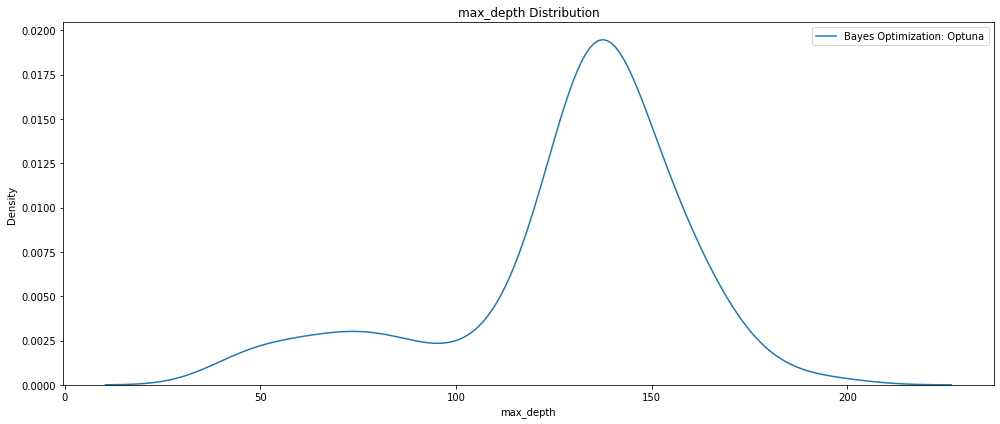

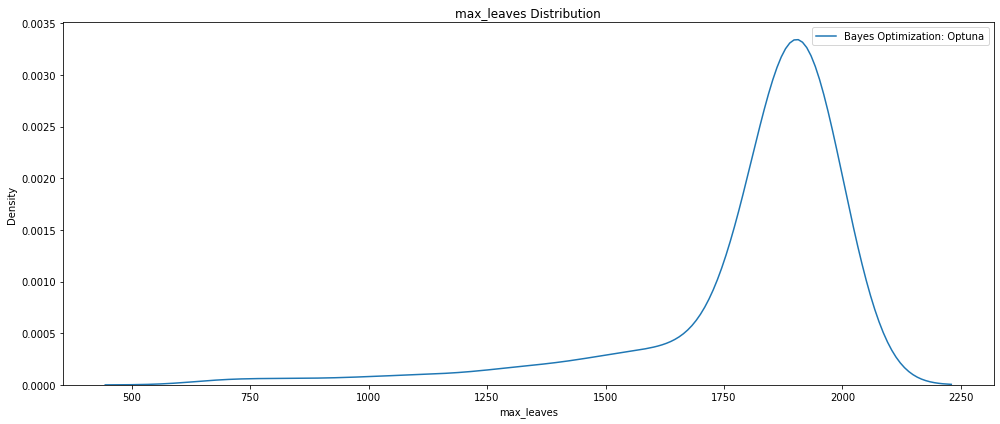

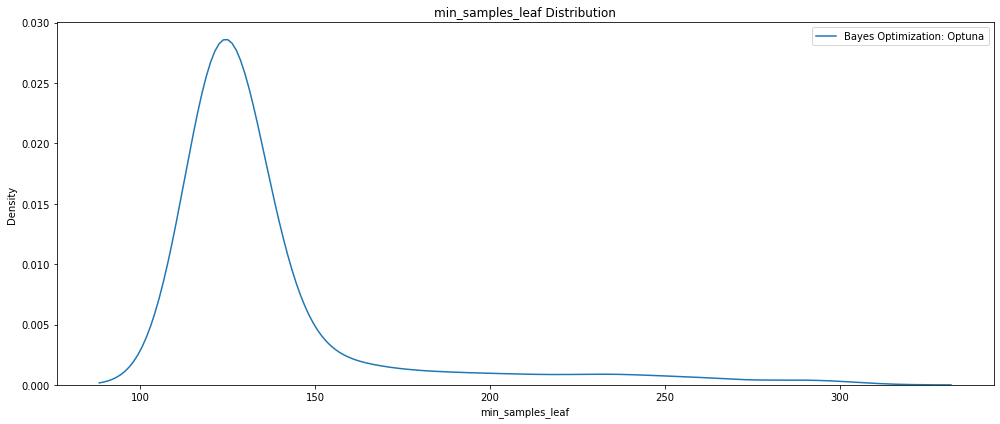

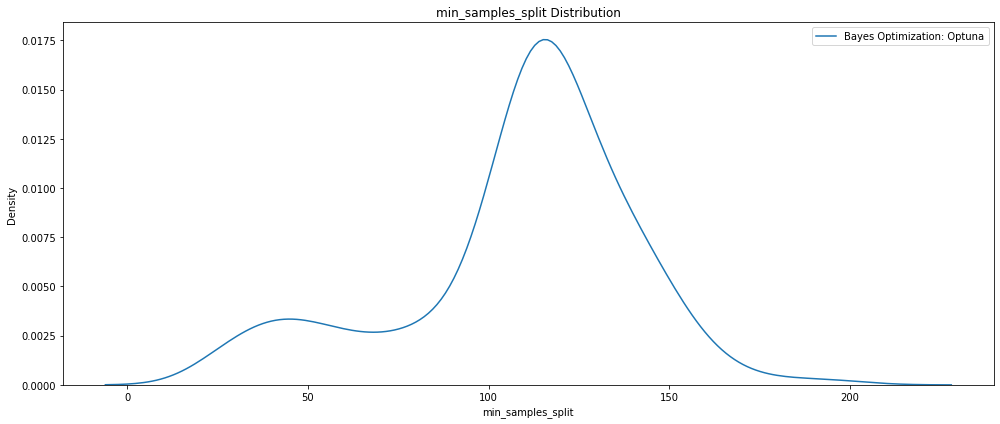

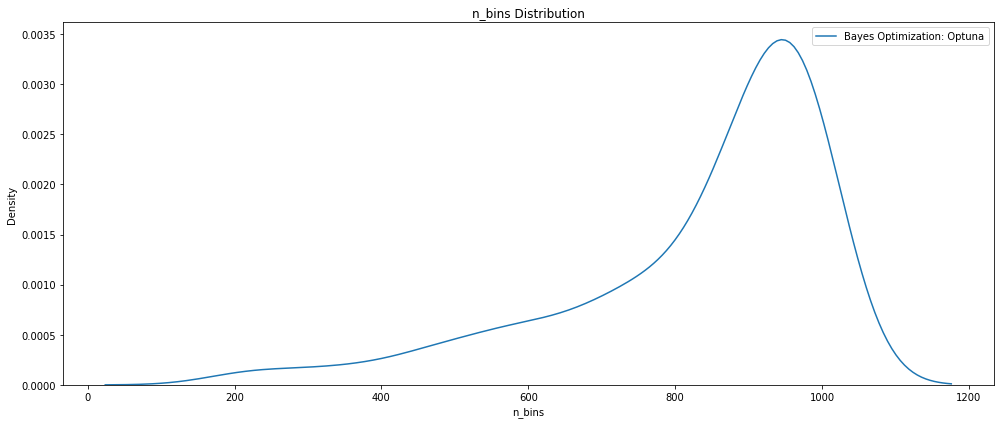

In [ ]:
# Create plots of Hyperparameters that are numeric 
for i, hpo in enumerate(trials_df.columns):
    if hpo not in ['iteration', 'rmse', 'datetime_start', 'datetime_complete',
                   'duration', 'n_estimators', 'state']:
        plt.figure(figsize=(14,6))
        # Plot the bayes search distribution
        if hpo != 'loss':
            sns.kdeplot(trials_df[hpo], label='Bayes Optimization: Optuna')
            plt.legend(loc=0)
            plt.title('{} Distribution'.format(hpo))
            plt.xlabel('{}'.format(hpo)); plt.ylabel('Density')
            plt.tight_layout()
            plt.show()

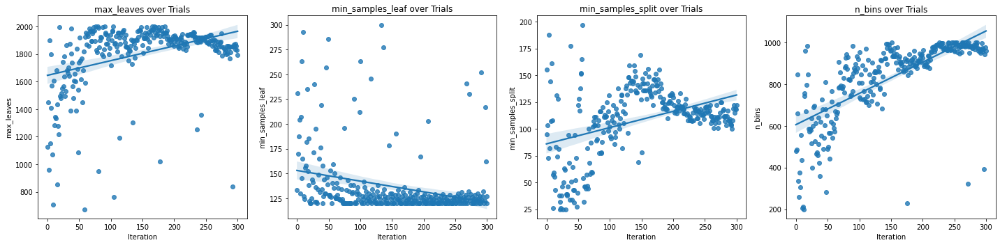

In [ ]:
# Plot quantitive hyperparameters
fig, axs = plt.subplots(1, 4, figsize=(20,5))
i = 0
axs = axs.flatten()
for i, hpo in enumerate(['max_leaves', 'min_samples_leaf', 'min_samples_split',
                         'n_bins']):
    # Scatterplot
    sns.regplot('iteration', hpo, data=trials_df, ax=axs[i]) 
    axs[i].set(xlabel='Iteration', ylabel='{}'.format(hpo), 
               title='{} over Trials'.format(hpo))
plt.tight_layout()
plt.show()

In [ ]:
# Visualize parameter importances
fig = optuna.visualization.plot_param_importances(study)
py.plot(fig, filename='paramImportance_RF_Optuna_300_GPU_paramsHi2.html')
fig.show()

In [ ]:
# Visualize empirical distribution function
fig = optuna.visualization.plot_edf(study)
py.plot(fig, filename='edf_RF_Optuna_300_GPU_paramsHi2.html')
fig.show()

In [ ]:
# Arrange best parameters to fit model for model metrics
params = study.best_params   
params['random_state'] = seed_value
params

{'n_estimators': 1812,
 'max_depth': 143,
 'max_leaves': 1914,
 'min_samples_leaf': 120,
 'min_samples_split': 122,
 'n_bins': 936,
 'random_state': 42}

In [ ]:
# Write results to ML Results
%cd /notebooks/UsedCarsCarGurus/Models/ML/RF/Optuna/Model_PKL

/notebooks/UsedCarsCarGurus/Models/ML/RF/Optuna/Model_PKL


In [ ]:
# Re-create the best model and train on the training data
best_model = RandomForestRegressor(n_streams=1, **params)

# Fit the model
best_model.fit(X_train, y_train)

# Save model
Pkl_Filename = 'RF_Optuna_trials300_GPU_paramsHi2.pkl'  

with open(Pkl_Filename, 'wb') as file:  
    pickle.dump(best_model, file)

# =============================================================================
# # To load saved model
# model = joblib.load('RF_Optuna_trials300_GPU_paramsHi2.pkl')
# print(model)
# =============================================================================

print('\nModel Metrics for RF HPO 300 GPU trials')
y_train_pred = best_model.predict(X_train)
y_test_pred = best_model.predict(X_test)

print('MAE train: %.3f, test: %.3f' % (
        mean_absolute_error(y_train.to_numpy(), y_train_pred.to_numpy()),
        mean_absolute_error(y_test.to_numpy(), y_test_pred.to_numpy())))
print('MSE train: %.3f, test: %.3f' % (
        mean_squared_error(y_train.to_numpy(), y_train_pred.to_numpy()),
        mean_squared_error(y_test.to_numpy(), y_test_pred.to_numpy())))
print('RMSE train: %.3f, test: %.3f' % (
        mean_squared_error(y_train.to_numpy(), y_train_pred.to_numpy(), 
                           squared=False),
        mean_squared_error(y_test.to_numpy(), y_test_pred.to_numpy(), 
                           squared=False)))
print('R^2 train: %.3f, test: %.3f' % (
        r2_score(y_train.to_numpy(), y_train_pred.to_numpy()),
        r2_score(y_test.to_numpy(), y_test_pred.to_numpy())))


Model Metrics for RF HPO 300 GPU trials
MAE train: 2046.867, test: 2046.867
MSE train: 7527952.387, test: 7527952.387
RMSE train: 2743.711, test: 2743.711
R^2 train: 0.918, test: 0.918


In [ ]:
# Evaluate on the testing data 
print('The best model from optimization scores {:.5f} MSE on the test set.'.format(mean_squared_error(y_test.to_numpy(), 
                                                                                                      y_test_pred.to_numpy())))
print('This was achieved using these conditions:')
print(trials_df.iloc[0])

The best model from optimization scores 7527952.38666 MSE on the test set.
This was achieved using these conditions:
iteration                                   209
rmse                                2743.711426
datetime_start       2023-02-25 23:57:01.935184
datetime_complete    2023-02-26 00:05:42.675719
duration                 0 days 00:08:40.740535
max_depth                                 143.0
max_leaves                               1914.0
min_samples_leaf                          120.0
min_samples_split                         122.0
n_bins                                    936.0
n_estimators                             1812.0
state                                  COMPLETE
Name: 209, dtype: object
